In [ ]:
# Install and Import Libraries
!pip install tensorflow opencv-python-headless object_detection geopy altair

In [ ]:
#Import Libraries and mount Google Drive
import pandas as pd
import numpy as np
import tensorflow as tf
from datetime import datetime
from geopy.distance import geodesic
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import cv2
import os
from google.colab.patches import cv2_imshow
from google.colab import drive
from object_detection.utils import visualization_utils as viz_utils
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Download and Load Pre-trained Model
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8.tar.gz
!tar -xvf faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8.tar.gz
model = tf.saved_model.load('faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8/saved_model')

--2024-07-15 06:14:00--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.214.207, 142.251.183.207, 173.194.206.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.214.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 444343592 (424M) [application/x-tar]
Saving to: ‘faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8.tar.gz.8’

faster_rcnn_incepti 100%[===================>] 423.76M   227MB/s    in 1.9s    

2024-07-15 06:14:02 (227 MB/s) - ‘faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8.tar.gz.8’ saved [444343592/444343592]

faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8/
faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8/checkpoint/
faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
faster_rcnn_inception_resnet_v2_640x640_coco17

In [ ]:
# Define Helper Functions
def load_image_into_numpy_array(image_path):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image_rgb

def run_inference(model, image_np):
    input_tensor = tf.convert_to_tensor(image_np)
    input_tensor = input_tensor[tf.newaxis, ...]
    detections = model(input_tensor)
    return detections

def calculate_bbox_center(bbox):
    ymin, xmin, ymax, xmax = bbox
    return (ymin + ymax) / 2, (xmin + xmax) / 2

def calculate_distance_from_center(bbox_center, image_center):
    return np.sqrt((bbox_center[0] - image_center[0]) ** 2 + (bbox_center[1] - image_center[1]) ** 2)

def draw_boxes_and_extract_distances(image_np, detections, threshold=0.5):
    boxes = detections['detection_boxes'][0].numpy()
    scores = detections['detection_scores'][0].numpy()
    image_center = (image_np.shape[0] / 2, image_np.shape[1] / 2)
    distances = []

    for i in range(len(boxes)):
        if scores[i] > threshold:
            bbox_center = calculate_bbox_center(boxes[i])
            distance = calculate_distance_from_center(bbox_center, image_center)
            distances.append(distance)
            ymin, xmin, ymax, xmax = boxes[i]
            xmin = int(xmin * image_np.shape[1])
            xmax = int(xmax * image_np.shape[1])
            ymin = int(ymin * image_np.shape[0])
            ymax = int(ymax * image_np.shape[0])
            cv2.rectangle(image_np, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
            class_name = category_index[detections['detection_classes'][0][i].numpy()]['name']
            cv2.putText(image_np, f'{class_name} {distance:.2f}', (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

    return distances

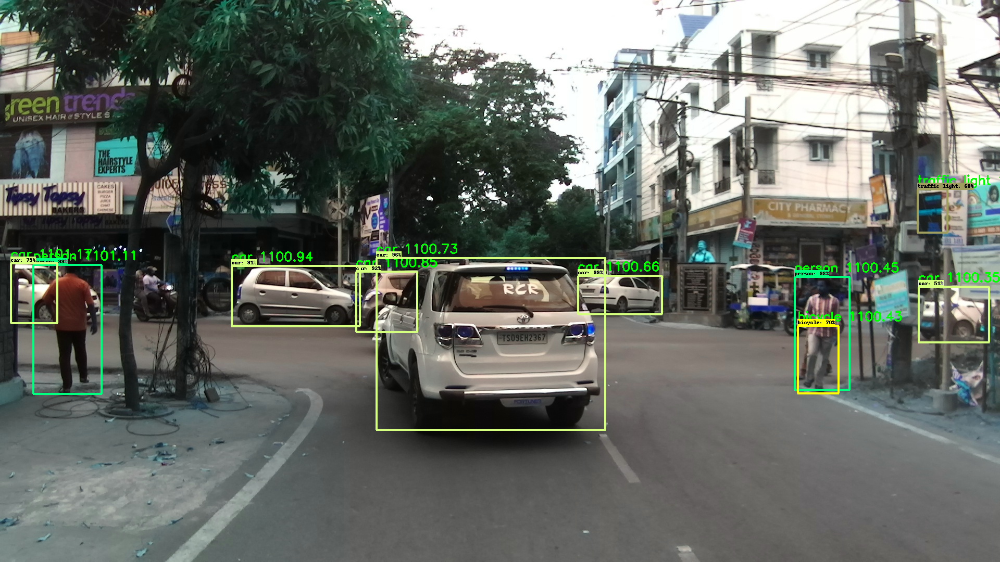

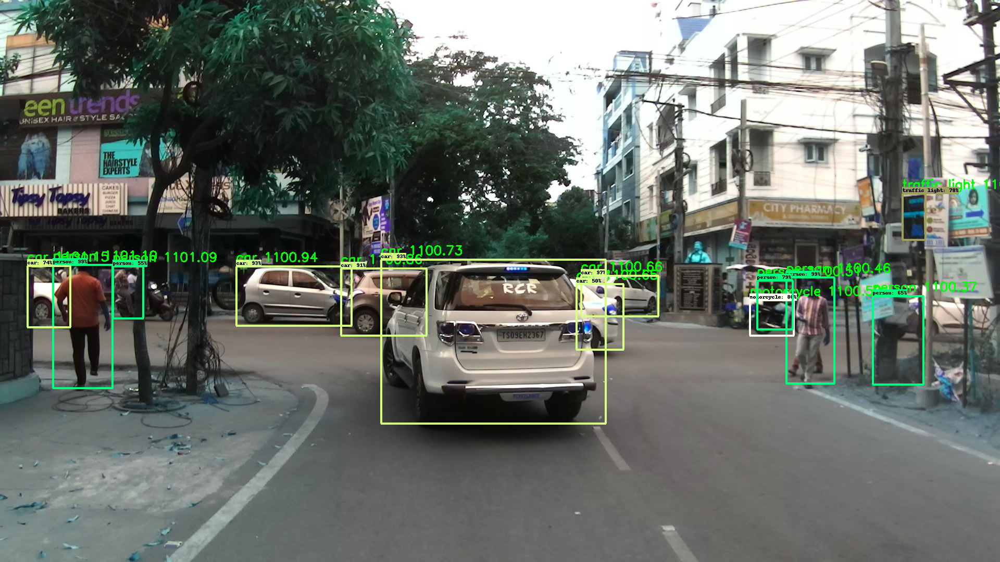

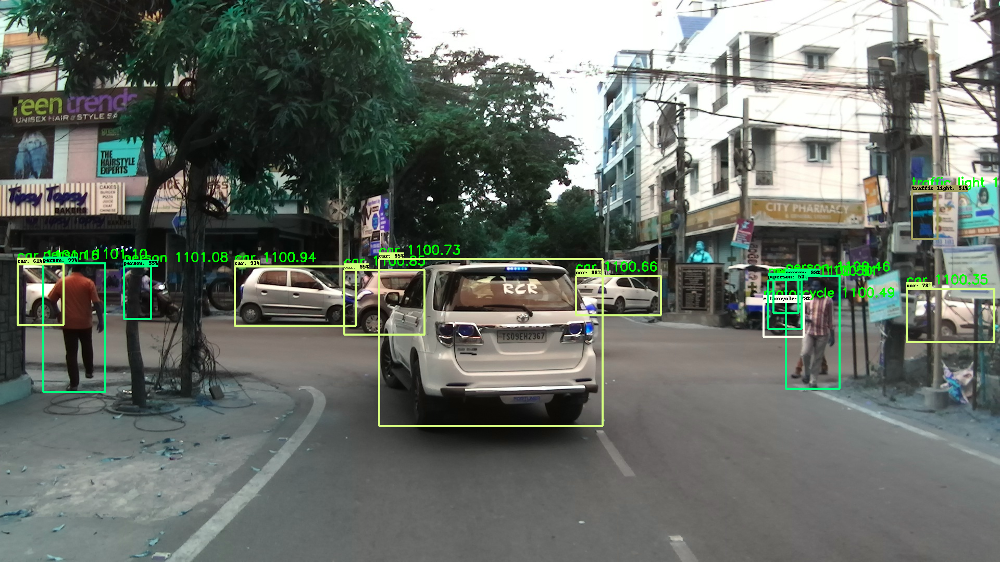

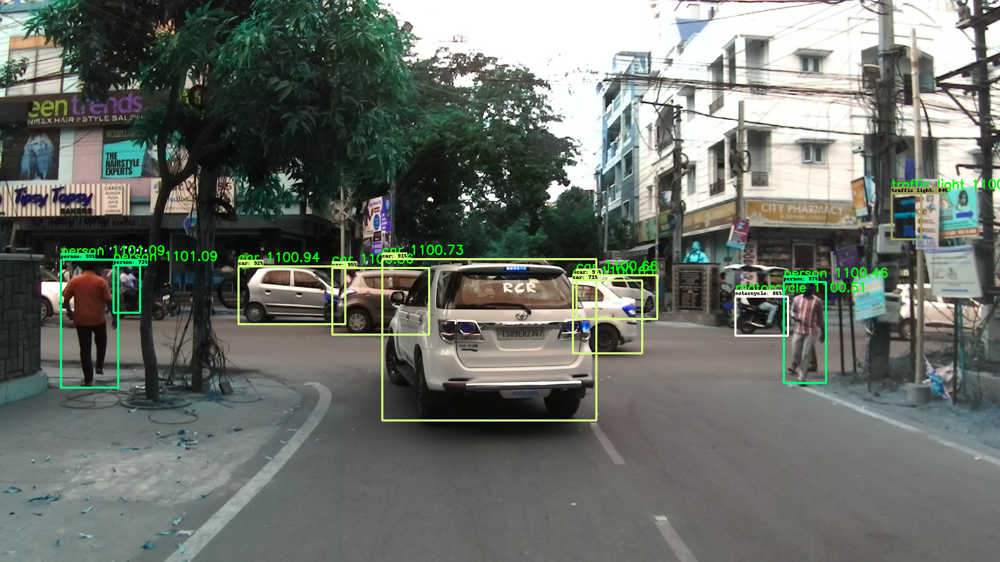

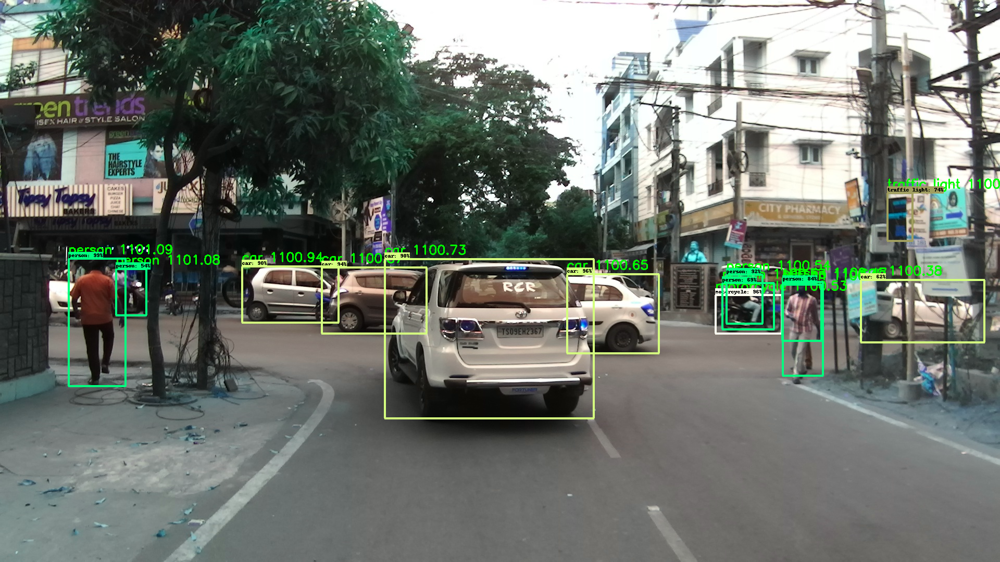

,image,distance_from_center
0,0002050.jpg,1101.107576
1,0002050.jpg,1100.655815
2,0002050.jpg,1100.446159
3,0002050.jpg,1100.725624
4,0002050.jpg,1100.853267


In [ ]:
#Object Detection on Images
category_index = {
    1: {'id': 1, 'name': 'person'},
    2: {'id': 2, 'name': 'bicycle'},
    3: {'id': 3, 'name': 'car'},
    4: {'id': 4, 'name': 'motorcycle'},
    5: {'id': 5, 'name': 'airplane'},
    6: {'id': 6, 'name': 'bus'},
    7: {'id': 7, 'name': 'train'},
    8: {'id': 8, 'name': 'truck'},
    9: {'id': 9, 'name': 'boat'},
    10: {'id': 10, 'name': 'traffic light'}
}
image_dir = '/content/drive/My Drive/images'
bbox_data = []

for filename in os.listdir(image_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(image_dir, filename)
        image_np = load_image_into_numpy_array(image_path)
        detections = run_inference(model, image_np)
        distances = draw_boxes_and_extract_distances(image_np, detections)
        for distance in distances:
            bbox_data.append({'image': filename, 'distance_from_center': distance})
        viz_utils.visualize_boxes_and_labels_on_image_array(
            image_np,
            detections['detection_boxes'][0].numpy(),
            detections['detection_classes'][0].numpy().astype(int),
            detections['detection_scores'][0].numpy(),
            category_index,
            use_normalized_coordinates=True,
            min_score_thresh=0.5
        )
        cv2_imshow(image_np)

bbox_df = pd.DataFrame(bbox_data)
bbox_df.to_csv('/content/drive/My Drive/bounding_boxes.csv', index=False)
bbox_df.head()

In [ ]:
# Load and Process Geospatial Data
data = pd.read_csv('/content/drive/My Drive/images/val.csv')

# Convert timestamp to datetime
data['datetime'] = data['timestamp'].apply(lambda x: datetime.strptime(x, '%H-%M-%S-%f'))

# Sort data by datetime
data = data.sort_values(by='datetime').reset_index(drop=True)

# Function to calculate distance between two geospatial points
def calculate_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).meters

# Calculate distances and time intervals
distances = []
time_intervals = []
for i in range(1, len(data)):
    lat1, lon1 = data.loc[i-1, ['latitude', 'longitude']]
    lat2, lon2 = data.loc[i, ['latitude', 'longitude']]
    distances.append(calculate_distance(lat1, lon1, lat2, lon2))
    time_diff = (data.loc[i, 'datetime'] - data.loc[i-1, 'datetime']).total_seconds()
    time_intervals.append(time_diff)

data['distance'] = [0] + distances  # Add a zero for the first entry
data['time_interval'] = [0] + time_intervals

# Estimate speeds (m/s)
data['speed'] = data['distance'] / data['time_interval'].replace(0, float('inf'))  # Avoid division by zero

# Function to calculate time to collision
def time_to_collision(distance, speed1, speed2):
    relative_speed = abs(speed1 - speed2)
    if relative_speed == 0:
        return float('inf')
    return distance / relative_speed

# Calculate time to collision
ttc_list = []
for i in range(1, len(data)):
    distance = data.loc[i, 'distance']
    speed1 = data.loc[i-1, 'speed']
    speed2 = data.loc[i, 'speed']
    ttc = time_to_collision(distance, speed1, speed2)
    ttc_list.append(ttc)

data['time_to_collision'] = [float('inf')] + ttc_list  # Add infinite time for the first entry
max_ttc = data['time_to_collision'].replace([float('inf'), -float('inf')], pd.NA).max()
data['time_to_collision'].replace([float('inf'), -float('inf')], max_ttc, inplace=True)

# Assuming collision if TTC < 0.6 seconds
data['collision'] = np.where(data['time_to_collision'] < 0.6, 1, 0)

data['image_idx'] = data['image_idx'].astype(str)

# Merge Bounding Box Features with Geospatial Data
data = data.merge(bbox_df, how='left', left_on='image_idx', right_on='image').drop(columns=['image'])
data.head()

,timestamp,image_idx,latitude,longitude,altitude,datetime,distance,time_interval,speed,time_to_collision,collision,distance_from_center
0,16-02-19-551670,2046,17.493477,78.410594,491.572449,1900-01-01 16:02:19.551670,0.000000,0.000000,0.000000,86.997670,0,NaN
1,16-02-19-617129,2047,17.493478,78.410593,491.578735,1900-01-01 16:02:19.617129,0.174576,0.065459,2.666957,0.065459,1,NaN
2,16-02-19-682363,2048,17.493480,78.410591,491.576019,1900-01-01 16:02:19.682363,0.337815,0.065234,5.178508,0.134504,1,NaN
3,16-02-19-755281,2049,17.493481,78.410590,491.572906,1900-01-01 16:02:19.755281,0.149546,0.072918,2.050880,0.047815,1,NaN
4,16-02-19-823425,2050,17.493482,78.410589,491.569977,1900-01-01 16:02:19.823425,0.160860,0.068144,2.360593,0.519385,1,NaN


In [ ]:
#Prepare Data for Machine Learning
features = ['latitude', 'longitude', 'speed', 'time_to_collision', 'distance_from_center']
X = data[features]
y = data['collision']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Ensure no NaN values
X_scaled = np.nan_to_num(X_scaled)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1047: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1052: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1072: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


In [ ]:
#Train a Neural Network
model = Sequential()
model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/50
28/28 [==============================] - 2s 18ms/step - loss: 0.5682 - accuracy: 0.7635 - val_loss: 0.4979 - val_accuracy: 0.7568
Epoch 2/50
28/28 [==============================] - 0s 6ms/step - loss: 0.4674 - accuracy: 0.7838 - val_loss: 0.4403 - val_accuracy: 0.7973
Epoch 3/50
28/28 [==============================] - 0s 8ms/step - loss: 0.4141 - accuracy: 0.8007 - val_loss: 0.3992 - val_accuracy: 0.8198
Epoch 4/50
28/28 [==============================] - 0s 9ms/step - loss: 0.3744 - accuracy: 0.8209 - val_loss: 0.3615 - val_accuracy: 0.8423
Epoch 5/50
28/28 [==============================] - 0s 6ms/step - loss: 0.3387 - accuracy: 0.8423 - val_loss: 0.3252 - val_accuracy: 0.8559
Epoch 6/50
28/28 [==============================] - 0s 4ms/step - loss: 0.3038 - accuracy: 0.8682 - val_loss: 0.2810 - val_accuracy: 0.8694
Epoch 7/50
28/28 [==============================] - 0s 4ms/step - loss: 0.2678 - accuracy: 0.8818 - val_loss: 0.2503 - val_accuracy: 0.8964
Epoch 8/50
28/28 [=

In [ ]:
#Predictions
data['collision_probability'] = model.predict(X_scaled)
data

35/35 [==============================] - 0s 2ms/step


,timestamp,image_idx,latitude,longitude,altitude,datetime,distance,time_interval,speed,time_to_collision,collision,distance_from_center,collision_probability
0,16-02-19-551670,2046,17.493477,78.410594,491.572449,1900-01-01 16:02:19.551670,0.000000,0.000000,0.000000,86.997670,0,NaN,0.000000
1,16-02-19-617129,2047,17.493478,78.410593,491.578735,1900-01-01 16:02:19.617129,0.174576,0.065459,2.666957,0.065459,1,NaN,0.999757
2,16-02-19-682363,2048,17.493480,78.410591,491.576019,1900-01-01 16:02:19.682363,0.337815,0.065234,5.178508,0.134504,1,NaN,0.999464
3,16-02-19-755281,2049,17.493481,78.410590,491.572906,1900-01-01 16:02:19.755281,0.149546,0.072918,2.050880,0.047815,1,NaN,0.999794
4,16-02-19-823425,2050,17.493482,78.410589,491.569977,1900-01-01 16:02:19.823425,0.160860,0.068144,2.360593,0.519385,1,NaN,0.759605
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1105,16-03-33-223920,3151,17.491009,78.407844,497.250946,1900-01-01 16:03:33.223920,0.233786,0.066685,3.505829,0.606895,0,NaN,0.341396
1106,16-03-33-290872,3152,17.491007,78.407841,497.255219,1900-01-01 16:03:33.290872,0.459959,0.066952,6.869983,0.136724,1,NaN,0.999956
1107,16-03-33-349313,3153,17.491005,78.407839,497.256500,1900-01-01 16:03:33.349313,0.235637,0.058441,4.032046,0.083031,1,NaN,0.999787
1108,16-03-33-428984,3154,17.491002,78.407836,497.260590,1900-01-01 16:03:33.428984,0.461848,0.079671,5.796943,0.261686,1,NaN,0.998676
